# Final Project: Examining Fractal Coefficients of Random Walks vs Tesla (TSLA) Stock
## Author: Hunter Hauser
## Spring 2022 
## CPSC455 - Gonzaga University

ALL THE NECESSARY LIBRARIES TO RUN CODE

In [ ]:
#SOURCE(S): (Aroussi)
!pip install yfinance
import numpy as np
import pylab as pl
import math
from IPython.core.pylabtools import figsize
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import yfinance as yf

Before making any Random Walk graphs and finding the fractal coefficients, a base case needed to be proven that my adapted box-counting method worked correctly and could find the fractal dimension of an object we can definitively say we have the dimension for. 

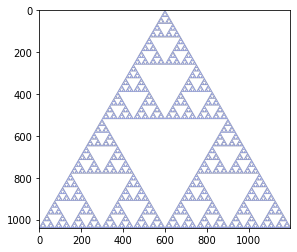

In [ ]:
img = mpimg.imread('drive/MyDrive/CPSC455/sierpinski_triangle.png')
imgplot = plt.imshow(img)
plt.show()

Thus, I chose the Sierpinski Triangle which has a fractal dimension of $\frac{log(3)}{log(2)} \approx  1.5849625007211563$. I calculated my fractals using the Hausdorff Dimension $N = r^D$ which converts to $D = \frac{log(N)}{log(r)}$. $N$ is the amount of boxes that cover the shape, in this case the 1-D shape, and $r$ is the scale at which the amount of boxes changes. Consequently, $D$ is the slope of the line that defines what the dimension is of the shape, and that is what I am calculating in this report. 

1200 1039
(110838, 2)
======= Scale : 1.0069555500567189
======= Scale : 1.0784804316944516
======= Scale : 1.1550857845535842
======= Scale : 1.2371324786871727
======= Scale : 1.3250070170452075
======= Scale : 1.4191233562003824
======= Scale : 1.5199248564015158
======= Scale : 1.6278863701408692
======= Scale : 1.7435164790741244
======= Scale : 1.8673598898306263
Fractal for Sierpinski Triangle: 1.5940727587308772
Actual: 1.5849625007211563


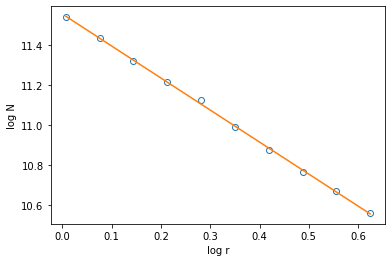

In [ ]:
#SOURCE(S): (“Box Counting in Numpy.”)
def rgb2gray(rgb):
    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    return gray
 
image=rgb2gray(pl.imread("drive/MyDrive/CPSC455/sierpinski_triangle.png"))
 
# finding all the non-zero pixels
pixels=[]
for i in range(image.shape[0]):
    for j in range(image.shape[1]):
        if image[i,j]>0:
            pixels.append((i,j))
 
Lx=image.shape[1]
Ly=image.shape[0]
print (Lx, Ly)
pixels=pl.array(pixels)
print (pixels.shape)
 
# computing the fractal dimension
#considering only scales in a logarithmic list
scales=np.logspace(0.01, 1, num=10, endpoint=False, base=2)
Ns=[]
# looping over several scales
for scale in scales:
    print ("======= Scale :",scale)
    # computing the histogram
    H, edges=np.histogramdd(pixels, bins=(np.arange(0,Lx,scale),np.arange(0,Ly,scale)))
    Ns.append(np.sum(H>0))
 
# linear fit, polynomial of degree 1
coeffs=np.polyfit(np.log(scales), np.log(Ns), 1)
 
pl.plot(np.log(scales),np.log(Ns), 'o', mfc='none')
pl.plot(np.log(scales), np.polyval(coeffs,np.log(scales)))
pl.xlabel('log r')
pl.ylabel('log N')
pl.savefig('sierpinski_dimension.pdf')
 
print ("Fractal for Sierpinski Triangle:", -coeffs[0]) #the fractal dimension is the OPPOSITE of the fitting coefficient
print ("Actual:", math.log(3)/math.log(2))

The above images shows the slope of the graph with the y-axis corresponding to the $log(N)$ and the x-axis corresponding to the $log(r)$. This is a visual representation of the Fractal coefficient result, which came out to: $1.5940727587308772$. This value is the approximate fractal dimension the code above generates for the Sierpinski Triangle. However we know the actual amount from above. This means the code above has an error of $1.5940727587308772 - 1.5849625007211563 = 0.009110258009720873$. For the sake of the rest of the report we will approach this error as $\pm0.01$ or $0.574793$% error. The current box-counting method is not perfect but fairly accurate enough to now analyze the random walks. This now allows me to create a hypothesis about the potential correlation between Tesla stock and random walks. 

Next, I will generate 100 random walk graphs for the span of 5 years (1825 days) to then analyze and find an average fractal coefficient for.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


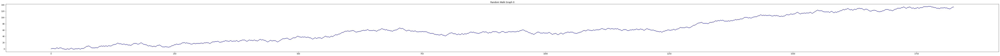

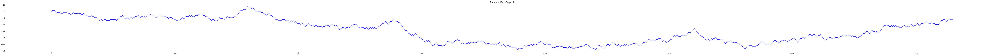

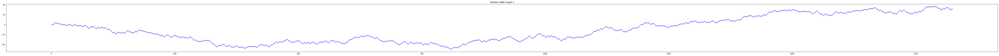

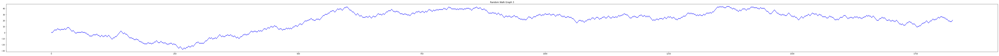

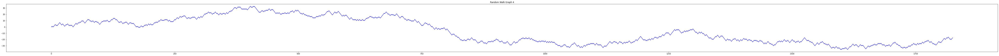

...

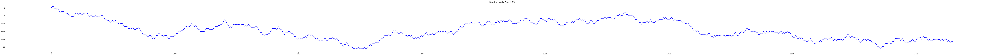

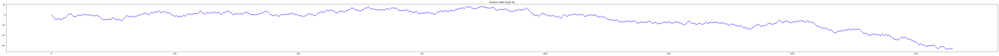

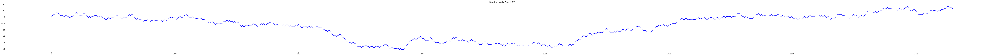

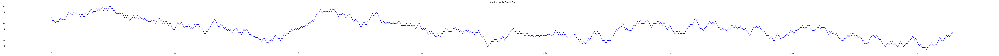

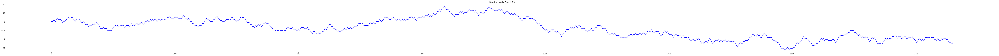

In [ ]:
#SOURCE(S): (Jalli)
def Randomwalk1D(n): #n here is the no. of steps that we require
   x = 0
   y = 0
   xposition = [0] #starting from origin (0,0)
   yposition = [0] 
   for i in range (1,n+1):
       step = np.random.uniform(0,1)
       if step < 0.5: # if step is less than 0.5 we move up    
           x += 1
           y += 1  #moving up in u direction
       if step > 0.5: # if step is greater than 0.5 we move down  
           x += 1
           y += -1 #moving down in y direction
 
       xposition.append(x)
       yposition.append(y)
   return [xposition,yposition]

def invert (x):
  img = mpimg.imread(x)
  R, G, B = img[:,:,0], img[:,:,1], img[:,:,2]
  imgGray = -(0.2989 * R + 0.5870 * G + 0.1140 * B)
  plt.imsave(x, imgGray, cmap='gray')

for i in range(100):  
  Randwalk = Randomwalk1D(1825) #creating an object for the Randomwalk1D class and passing value of n as 100
  plt.figure(figsize=(100,5))
  plt.title("Random Walk Graph " + str(i))
  plt.plot(Randwalk[0],Randwalk[1],'b-', label = "Randwalk1D") # 'r-' makes the color of the path red
  plt.savefig('drive/MyDrive/CPSC455/RandomWalkGraphs/random_walk' + str(i) + '.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
  invert('drive/MyDrive/CPSC455/RandomWalkGraphs/random_walk' + str(i) + '.PNG')

In [ ]:
#SOURCE(S): (“Box Counting in Numpy.”)
def rgb2gray(rgb):
    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    return gray

def BoxCount(originalImage):
  image = rgb2gray(pl.imread(originalImage))
  
  # finding all the non-zero pixels
  pixels=[]
  for i in range(image.shape[0]):
      for j in range(image.shape[1]):
          if image[i,j]>0:
              pixels.append((i,j))
  
  Lx=image.shape[1]
  Ly=image.shape[0]
  #print (Lx, Ly)
  pixels=pl.array(pixels)
  #print (pixels.shape)
  
  # computing the fractal dimension
  #considering only scales in a logarithmic list
  scales=np.logspace(0.01, 1, num=10, endpoint=False, base=2)
  Ns=[]
  # looping over several scales
  for scale in scales:
      #print ("======= Scale :",scale)
      # computing the histogram
      H, edges=np.histogramdd(pixels, bins=(np.arange(0,Lx,scale),np.arange(0,Ly,scale)))
      Ns.append(np.sum(H>0))
  
  # linear fit, polynomial of degree 1
  coeffs=np.polyfit(np.log(scales), np.log(Ns), 1)
  return -coeffs[0]



Fractal for Random Walk: 1.9749451541915382


' \npl.plot(np.log(scales),np.log(Ns), \'o\', mfc=\'none\')\npl.plot(np.log(scales), np.polyval(coeffs,np.log(scales)))\npl.xlabel(\'log $\\epsilon$\')\npl.ylabel(\'log N\')\npl.savefig(\'sierpinski_dimension.pdf\')\n \nprint ("Fractal for Random Walk:", -coeffs[0]) #the fractal dimension is the OPPOSITE of the fitting coefficient\nnp.savetxt("scaling.txt", list(zip(scales,Ns)))\n'

In [ ]:
RandomGraphCoeff = []
for i in range(100):
  RandomGraphCoeff.append(BoxCount('drive/MyDrive/CPSC455/RandomWalkGraphs/random_walk' + str(i) + '.PNG'))

In [ ]:
print(RandomGraphCoeff)
print("Average Fractal Coefficient of 100 Random Walks:", sum(RandomGraphCoeff) / len(RandomGraphCoeff))

[1.1756065168943508, 1.185195673151398, 1.144674999047245, 1.1448029925453302, 1.1384772487491244, 1.1716256534247276, 1.1650078237813357, 1.1368070791427565, 1.1432726811176004, 1.1632935185609385, 1.139272540934777, 1.148068697588319, 1.1489883996497545, 1.1346977259792532, 1.1318683603487998, 1.1687629558723707, 1.1276546829565315, 1.1668863586297318, 1.1583434241970194, 1.142181068953291, 1.1361147402867273, 1.1611692172379016, 1.1485732585033102, 1.1612886529230773, 1.1626731537189943, 1.1196547382326545, 1.1268720147398, 1.1292121699844706, 1.136081418587186, 1.1398959131798836, 1.1587439087725155, 1.1392115963098015, 1.1354085149878461, 1.168605220053719, 1.1462476543070286, 1.1739904450640215, 1.1547481235932147, 1.1691881570183262, 1.1767176281997676, 1.1835423079499312, 1.1576229896049435, 1.136248583821994, 1.1343100449113608, 1.138424254677069, 1.171887532224038, 1.151050336634777, 1.1432459032649729, 1.1417824388443376, 1.156542012037448, 1.1607686522697067, 1.152864472850

#### Hypothesis: 
From the above Fractal coefficient generated from the analysis of 100 random walk graphs, I believe TSLA stock will be within $\pm0.05$ or $2.873965$% error of the above fractal dimension of $1.1517125480157102$, regardless of the time period of 5 years, 1 year period, 6 month period, and 1 month period. The reason for choosing this value is because a stock can be affected by random real world events thus I am giving the error percentage more room to correlate to the random walk graphs. When results agree with my conclusion this will mean stocks are correlated to random walks and sadly, my conclusion will not break the stock market as we know it. Also, throughout this report I may refer to the average of the Random Walk Coefficients as the **RMA** (Random Walk Average).

First, I will compare the fractal coefficient of TSLA stock from the last 5 years at closing price to the RMA. 

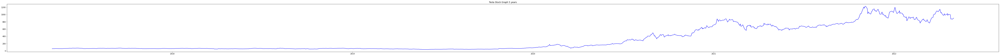

In [ ]:
#Generate graph for last 5 years TSLA (Tesla) closing prices
import yfinance as yf
import matplotlib.pyplot as plt
tsla = yf.Ticker('TSLA')
hist = tsla.history(period='5y')
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 5 years")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk.PNG')
plt.show()

In [ ]:
#SOURCE(S): (“Box Counting in Numpy.”)
def rgb2gray(rgb):
    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    return gray
 
image=rgb2gray(pl.imread("drive/MyDrive/CPSC455/tesla_walk.PNG"))
 
# finding all the non-zero pixels
pixels=[]
for i in range(image.shape[0]):
    for j in range(image.shape[1]):
        if image[i,j]>0:
            pixels.append((i,j))
 
Lx=image.shape[1]
Ly=image.shape[0]
print (Lx, Ly)
pixels=pl.array(pixels)
print (pixels.shape)
 
# computing the fractal dimension
#considering only scales in a logarithmic list
scales=np.logspace(0.01, 1, num=10, endpoint=False, base=2)
Ns=[]
# looping over several scales
for scale in scales:
    print ("======= Scale :",scale)
    # computing the histogram
    H, edges=np.histogramdd(pixels, bins=(np.arange(0,Lx,scale),np.arange(0,Ly,scale)))
    Ns.append(np.sum(H>0))

coeffs=np.polyfit(np.log(scales), np.log(Ns), 1) 
print ("Fractal for Tesla Stock (5 years): ", -coeffs[0]) #the fractal dimension is the OPPOSITE of the fitting coefficient

5612 304
(30010, 2)
======= Scale : 1.0069555500567189
======= Scale : 1.0784804316944516
======= Scale : 1.1550857845535842
======= Scale : 1.2371324786871727
======= Scale : 1.3250070170452075
======= Scale : 1.4191233562003824
======= Scale : 1.5199248564015158
======= Scale : 1.6278863701408692
======= Scale : 1.7435164790741244
======= Scale : 1.8673598898306263
Fractal for Tesla Stock (5 years):  1.1789050415933775


The dimension my code yielded was: $1.1789050415933775$, a $2.36105$% error from the RMA. This correlates with my hypothesis and essentially means the activity of the TSLA stock over the entirety of the 5 year span can be classified as random. Luckily for investors this stock went up. 

Next, I will approach each year individually from 2017 - 2022. 

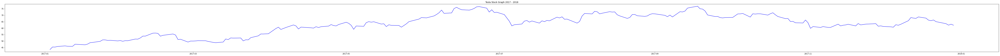

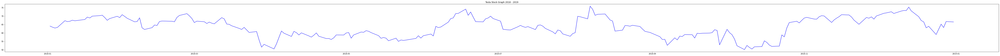

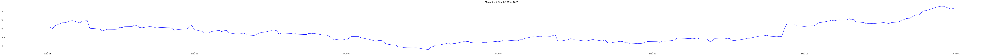

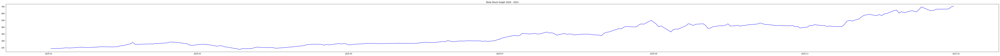

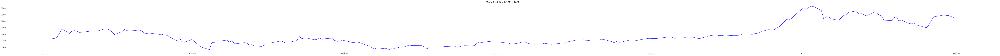

In [ ]:
#Generate graph for 2017-2018 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2017-01-01', end='2018-01-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2017 - 2018")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_17_18.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_17_18.PNG')
plt.show()
#Generate graph for 2018-2019 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2018-01-01', end='2019-01-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2018 - 2019")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_18_19.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_18_19.PNG')
plt.show()
#Generate graph for 2019-2020 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2019-01-01', end='2020-01-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2019 - 2020")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_19_20.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_19_20.PNG')
plt.show()
#Generate graph for 2020-2021 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2020-01-01', end='2021-01-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2020 - 2021")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_20_21.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_20_21.PNG')
plt.show()
#Generate graph for 2021-2022 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2021-01-01', end='2022-01-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2021 - 2022")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_21_22.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_21_22.PNG')
plt.show()

In [ ]:
#SOURCE(S): (“Box Counting in Numpy.”)
def TSLA_1_year(filename, date):
  def rgb2gray(rgb):
      r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
      gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
      return gray
  
  image=rgb2gray(pl.imread(filename))
  
  # finding all the non-zero pixels
  pixels=[]
  for i in range(image.shape[0]):
      for j in range(image.shape[1]):
          if image[i,j]>0:
              pixels.append((i,j))
  
  Lx=image.shape[1]
  Ly=image.shape[0]
  print (Lx, Ly)
  pixels=pl.array(pixels)
  print (pixels.shape)
  
  # computing the fractal dimension
  #considering only scales in a logarithmic list
  scales=np.logspace(0.01, 1, num=10, endpoint=False, base=2)
  Ns=[]
  # looping over several scales
  for scale in scales:
      print ("======= Scale :",scale)
      # computing the histogram
      H, edges=np.histogramdd(pixels, bins=(np.arange(0,Lx,scale),np.arange(0,Ly,scale)))
      Ns.append(np.sum(H>0))

  coeffs=np.polyfit(np.log(scales), np.log(Ns), 1)  
  print ("Fractal for Tesla Stock (" + date + ") Stock:", -coeffs[0]) #the fractal dimension is the OPPOSITE of the fitting coefficient

In [ ]:
print("*************************************************************")
TSLA_1_year("drive/MyDrive/CPSC455/tesla_walk_17_18.PNG", "2017-2018")
print("*************************************************************")
TSLA_1_year("drive/MyDrive/CPSC455/tesla_walk_18_19.PNG", "2018-2019")
print("*************************************************************")
TSLA_1_year("drive/MyDrive/CPSC455/tesla_walk_19_20.PNG", "2019-2020")
print("*************************************************************")
TSLA_1_year("drive/MyDrive/CPSC455/tesla_walk_20_21.PNG", "2020-2021")
print("*************************************************************")
TSLA_1_year("drive/MyDrive/CPSC455/tesla_walk_21_22.PNG", "2021-2022")
print("*************************************************************")

*************************************************************
5599 304
(29304, 2)
======= Scale : 1.0069555500567189
======= Scale : 1.0784804316944516
======= Scale : 1.1550857845535842
======= Scale : 1.2371324786871727
======= Scale : 1.3250070170452075
======= Scale : 1.4191233562003824
======= Scale : 1.5199248564015158
======= Scale : 1.6278863701408692
======= Scale : 1.7435164790741244
======= Scale : 1.8673598898306263
Fractal for Tesla Stock (2017-2018) Stock: 1.1812140324804465
*************************************************************
5599 304
(33230, 2)
======= Scale : 1.0069555500567189
======= Scale : 1.0784804316944516
======= Scale : 1.1550857845535842
======= Scale : 1.2371324786871727
======= Scale : 1.3250070170452075
======= Scale : 1.4191233562003824
======= Scale : 1.5199248564015158
======= Scale : 1.6278863701408692
======= Scale : 1.7435164790741244
======= Scale : 1.8673598898306263
Fractal for Tesla Stock (2018-2019) Stock: 1.160631634180451
*************

####2017-2018: 
This year generated the fractal coefficient of $1.1812140324804465$, $2.56153$% error from the RMA. This graph and stock period appears to yield randomness as well.
####2018-2019:
This year generated the fractal coefficient of $1.160631634180451$, $0.774419$% error from the RMA. This graph and stock period appears to yield randomness as well.
####2019-2020:
This year generated the fractal coefficient of $1.1657859972302573$, $1.22196$% error from the RMA. This graph and stock period appears to yield randomness as well.
####2020-2021:
This year generated the fractal coefficient of $1.1700123615821014$, $1.58892$% error from the RMA. This graph and stock period appears to yield randomness as well.
####2021-2022:
This year generated the fractal coefficient of $1.1957352033253648$, $3.82236$% error from the RMA. This graph and stock period appears to yield a more chaotic pattern as the rigidity of the graph has increased, leaving the error range. This means this graph is not associated with my randomness model and based on the graph above investing would have been a good idea. This will not apply all the time however chaos the higher the fractal coefficient means the more sparatic the graph is, and you would hope it is sparatic in an upward trend if you are investing. 



Next, I will look at the TSLA stock's first 6 months of each of the years listed above. This is to create a smaller window to check if certain times were better for investing. This is to look for trends or detect if there is no change. 

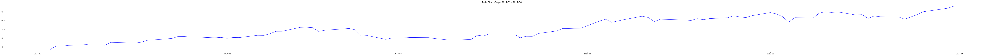

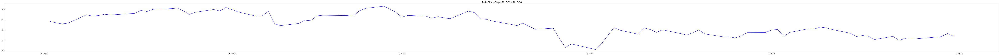

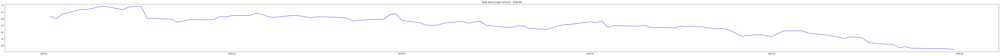

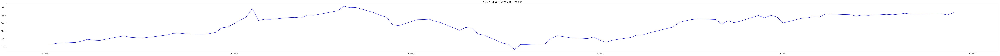

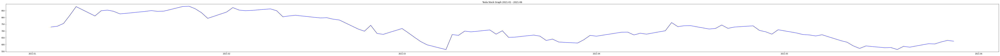

In [ ]:
#Generate graph for first 6 months of 2017 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2017-01-01', end='2017-06-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2017-01 - 2017-06")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_17_6.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_17_6.PNG')
plt.show()
#Generate graph for first 6 months of 2018 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2018-01-01', end='2018-06-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2018-01 - 2018-06")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_18_6.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_18_6.PNG')
plt.show()
#Generate graph for first 6 months of 2019 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2019-01-01', end='2019-06-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2019-01 - 2019-06")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_19_6.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_19_6.PNG')
plt.show()
#Generate graph for first 6 months of 2020 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2020-01-01', end='2020-06-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2020-01 - 2020-06")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_20_6.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_20_6.PNG')
plt.show()
#Generate graph for first 6 months of 2021 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2021-01-01', end='2021-06-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2021-01 - 2021-06")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_21_6.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_21_6.PNG')
plt.show()

In [ ]:
#SOURCE(S): (“Box Counting in Numpy.”)
def TSLA_6mo(filename, date):
  def rgb2gray(rgb):
      r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
      gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
      return gray
  
  image=rgb2gray(pl.imread(filename))
  
  # finding all the non-zero pixels
  pixels=[]
  for i in range(image.shape[0]):
      for j in range(image.shape[1]):
          if image[i,j]>0:
              pixels.append((i,j))
  
  Lx=image.shape[1]
  Ly=image.shape[0]
  print (Lx, Ly)
  pixels=pl.array(pixels)
  print (pixels.shape)
  
  # computing the fractal dimension
  #considering only scales in a logarithmic list
  scales=np.logspace(0.01, 1, num=10, endpoint=False, base=2)
  Ns=[]
  # looping over several scales
  for scale in scales:
      print ("======= Scale :",scale)
      # computing the histogram
      H, edges=np.histogramdd(pixels, bins=(np.arange(0,Lx,scale),np.arange(0,Ly,scale)))
      Ns.append(np.sum(H>0))

  coeffs=np.polyfit(np.log(scales), np.log(Ns), 1)   
  print ("Fractal for first 6 months of " + date + " TSLA Stock:", -coeffs[0]) #the fractal dimension is the OPPOSITE of the fitting coefficient

In [ ]:
print("*************************************************************")
TSLA_6mo("drive/MyDrive/CPSC455/tesla_walk_17_6.PNG", "2017")
print("*************************************************************")
TSLA_6mo("drive/MyDrive/CPSC455/tesla_walk_18_6.PNG", "2018")
print("*************************************************************")
TSLA_6mo("drive/MyDrive/CPSC455/tesla_walk_19_6.PNG", "2019")
print("*************************************************************")
TSLA_6mo("drive/MyDrive/CPSC455/tesla_walk_20_6.PNG", "2020")
print("*************************************************************")
TSLA_6mo("drive/MyDrive/CPSC455/tesla_walk_21_6.PNG", "2021")
print("*************************************************************")

*************************************************************
5599 304
(27626, 2)
======= Scale : 1.0069555500567189
======= Scale : 1.0784804316944516
======= Scale : 1.1550857845535842
======= Scale : 1.2371324786871727
======= Scale : 1.3250070170452075
======= Scale : 1.4191233562003824
======= Scale : 1.5199248564015158
======= Scale : 1.6278863701408692
======= Scale : 1.7435164790741244
======= Scale : 1.8673598898306263
Fractal for first 6 months of 2017 TSLA Stock: 1.1683822951099703
*************************************************************
5599 304
(28889, 2)
======= Scale : 1.0069555500567189
======= Scale : 1.0784804316944516
======= Scale : 1.1550857845535842
======= Scale : 1.2371324786871727
======= Scale : 1.3250070170452075
======= Scale : 1.4191233562003824
======= Scale : 1.5199248564015158
======= Scale : 1.6278863701408692
======= Scale : 1.7435164790741244
======= Scale : 1.8673598898306263
Fractal for first 6 months of 2018 TSLA Stock: 1.168030751519217
*****

####2017: 
This year generated the fractal coefficient of $1.1683822951099703$, $1.44739$% error from the RMA. This graph and stock period appears to yield randomness as well.
####2018:
This year generated the fractal coefficient of $1.168030751519217$, $1.41686$% error from the RMA. This graph and stock period appears to yield randomness as well.
####2019:
This year generated the fractal coefficient of $1.183269417194876$, $2.74$% error from the RMA. This graph and stock period appears to yield randomness as well.
####2020:
This year generated the fractal coefficient of $1.220718429329931$, $5.99159$% error from the RMA. This graph and stock period appears to be more sparatic and I believe this trend is occuring because Tesla motors has started to hit it's stride right around now, thus changing the rate and amount at which investors invest. This graph went up and down but overall was a good invesetment. 
####2021:
This year generated the fractal coefficient of $1.209862850343551$, $5.04903$% error from the RMA. This graph and stock period appears to be more sparatic, slightly less than first six months of the previous year. However, one thing to draw away is this graph moved around a lot but was an overall loss, speaking to the fact a higher fractal coefficient does not correlate to a good thing.  



For the final piece if analysis I will appraoch the first month of each of the previous years. 

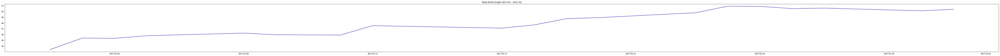

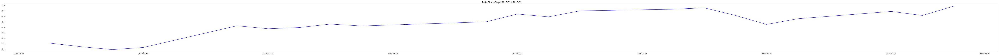

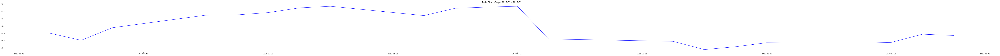

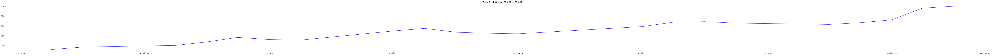

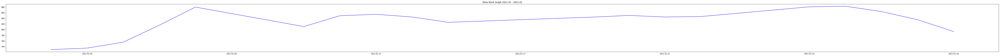

In [ ]:
#Generate graph for first 1 months of 2017 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2017-01-01', end='2017-02-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2017-01 - 2017-02")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_17_1.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_17_1.PNG')
plt.show()
#Generate graph for first 1 months of 2018 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2018-01-01', end='2018-02-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2018-01 - 2018-02")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_18_1.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_18_1.PNG')
plt.show()
#Generate graph for first 1 months of 2019 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2019-01-01', end='2019-02-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2019-01 - 2019-01")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_19_1.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_19_1.PNG')
plt.show()
#Generate graph for first 1 months of 2020 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2020-01-01', end='2020-02-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2020-01 - 2020-02")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_20_1.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_20_1.PNG')
plt.show()
#Generate graph for first 1 months of 2021 TSLA closing prices
tsla = yf.Ticker('TSLA')
hist=tsla.history(start='2021-01-01', end='2021-02-01', actions=False)
x=hist.index
y=hist['Close']
plt.figure(figsize=(100,5))
plt.title("Tesla Stock Graph 2021-01 - 2021-02")
plt.plot(x,y,'b-', label = "Tesla Stock")
plt.savefig('drive/MyDrive/CPSC455/tesla_walk_21_1.PNG', bbox_inches='tight', transparent=True, pad_inches=0)
invert('drive/MyDrive/CPSC455/tesla_walk_21_1.PNG')
plt.show()

In [ ]:
#SOURCE(S): (“Box Counting in Numpy.”)
def TSLA_1mo(filename, date):
  def rgb2gray(rgb):
      r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
      gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
      return gray
  
  image=rgb2gray(pl.imread(filename))
  
  # finding all the non-zero pixels
  pixels=[]
  for i in range(image.shape[0]):
      for j in range(image.shape[1]):
          if image[i,j]>0:
              pixels.append((i,j))
  
  Lx=image.shape[1]
  Ly=image.shape[0]
  print (Lx, Ly)
  pixels=pl.array(pixels)
  print (pixels.shape)
  
  # computing the fractal dimension
  #considering only scales in a logarithmic list
  scales=np.logspace(0.01, 1, num=10, endpoint=False, base=2)
  Ns=[]
  # looping over several scales
  for scale in scales:
      print ("======= Scale :",scale)
      # computing the histogram
      H, edges=np.histogramdd(pixels, bins=(np.arange(0,Lx,scale),np.arange(0,Ly,scale)))
      Ns.append(np.sum(H>0))

  coeffs=np.polyfit(np.log(scales), np.log(Ns), 1)   
  print ("Fractal for first 1 months of " + date + " TSLA Stock:", -coeffs[0]) #the fractal dimension is the OPPOSITE of the fitting coefficient

In [ ]:
print("*************************************************************")
TSLA_1mo("drive/MyDrive/CPSC455/tesla_walk_17_1.PNG", "2017")
print("*************************************************************")
TSLA_1mo("drive/MyDrive/CPSC455/tesla_walk_18_1.PNG", "2018")
print("*************************************************************")
TSLA_1mo("drive/MyDrive/CPSC455/tesla_walk_19_1.PNG", "2019")
print("*************************************************************")
TSLA_1mo("drive/MyDrive/CPSC455/tesla_walk_20_1.PNG", "2020")
print("*************************************************************")
TSLA_1mo("drive/MyDrive/CPSC455/tesla_walk_21_1.PNG", "2021")
print("*************************************************************")

*************************************************************
5599 304
(27821, 2)
======= Scale : 1.0069555500567189
======= Scale : 1.0784804316944516
======= Scale : 1.1550857845535842
======= Scale : 1.2371324786871727
======= Scale : 1.3250070170452075
======= Scale : 1.4191233562003824
======= Scale : 1.5199248564015158
======= Scale : 1.6278863701408692
======= Scale : 1.7435164790741244
======= Scale : 1.8673598898306263
Fractal for first 1 months of 2017 TSLA Stock: 1.1744150136165183
*************************************************************
5599 304
(28603, 2)
======= Scale : 1.0069555500567189
======= Scale : 1.0784804316944516
======= Scale : 1.1550857845535842
======= Scale : 1.2371324786871727
======= Scale : 1.3250070170452075
======= Scale : 1.4191233562003824
======= Scale : 1.5199248564015158
======= Scale : 1.6278863701408692
======= Scale : 1.7435164790741244
======= Scale : 1.8673598898306263
Fractal for first 1 months of 2018 TSLA Stock: 1.2244858749897332
****

####2017: 
This year generated the fractal coefficient of $1.1744150136165183$, $1.97119$% error from the RMA. This graph and stock period appears to yield randomness as well.
####2018:
This year generated the fractal coefficient of $1.2244858749897332$, $6.31871$% error from the RMA. This graph was the most sparatic. It had the highest percent error, but it also continiually went up. This graph was not in my randomness model and would have preformed well. 
####2019:
This year generated the fractal coefficient of $1.213572186447068$, $5.3711$% error from the RMA. This sparatic graph had a large drop off halfway through the month and would have preformed poorly overall. 
####2020:
This year generated the fractal coefficient of $1.1588849790082834$, $0.622762$% error from the RMA. This graph and stock period appears to yield randomness as well.
####2021:
This year generated the fractal coefficient of $1.1664203966485576$, $1.27704$% error from the RMA. This graph and stock period appears to yield randomness as well.  



## Conclusion for the Report
After analyzing the results of the TSLA stock over several different periods of time and comparing the results to the RMA, I can conclude that the stock was more random than trend heavy. Not only did the data yield this result, but I feel it was apparent from the beginning. The 5 year graph already fell within the alloted percent error from the hypothesis. 

Of course my hypothesis is not the say all be all. It again is my hypothesis and can be disproven by a better box-counting method and or a better method to caluclate the Hausdorff dimension in its entirety. 

One thing to address in this report is fractal coefficient discrepancy and what it means. A higher fractal coefficient means the graph is more sparatic, not necessarily in an upward trend. Having a sparatic graph means there is dips in the graph! Increased rigidity means up and down movement. A decreased fractal coefficient means the line is close to being straight. This means consistency. In terms of investment one would hope that is is consistently going up, rather than down. However, that is one thing to point out. 

Overall Random Walk graphs did not provide extreme insight into Tesla stocks rather than saying most of its behavior exuded randomness, thus trends were hard to find, and luckily for Tesla investors, if they got in early, they made some money in the end. Their random walk went upwards. 

## Important Errors to Recognize 
In this experiment, I believe the reason I could not calculate the error with $0%$ is because pixel density of the images and just the method itself could not get to a level so small that a piece of each shape would not be missed. Thus stating before, there may be a better and more accurate method that exists for this experiment. 

Another thing I approached was issues with calculating the dimension. I originally obtained an RMA of $\approx 1.97$ which is clearly not correct when analyzing 1-D objects. However this error was very significant as I already created $956$ Random-Walk graphs and preformed the box counting dimension on them. This process took several hours and sadly after I figured out my errors. The code written was counting everything but the shape itself and thus I had to invert the image. This made more calls to my Google Drive causing even more latency in the project. This overall delay resulted in my use of only $100$ random walk graphs rather than $1000$. Obviously, more graphs would have produced an even better RMA but maybe for a further experiment I could fix this issue and use more processing power and storage to get an even more accurate result. 

## For the Future
I would like to extend this project to other infamous stocks and potenetially analyzing every stock. It would be very impressive to find trends in the stock market that could potential lead to beneficial investments. However the scale of data mining and research like that would take a lot more computing power than I have at hand. 


## Works Cited 
### Aroussi, Ran. “Yfinance.” PyPI, https://pypi.org/project/yfinance/. 
### “Box Counting in Numpy.” Francesco Turci, 15 Apr. 2019, https://francescoturci.net/2016/03/31/box-counting-in-numpy/. 
###  Jalli, Artturi. “Random Walk in Python.” Codingem, 2 Feb. 2022, https://www.codingem.com/random-walk-in-python/. 